In [1]:
import warnings
warnings.filterwarnings('ignore')

import shapely
import geopandas as gpd
from shapely.geometry import Point, Polygon, MultiPolygon
from geopandas import GeoDataFrame
import matplotlib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from shapely import wkt
import seaborn as sns
from tqdm import tqdm
from pyproj import Geod
geod = Geod(ellps="WGS84")


from shapely import wkt
from tqdm.notebook import tqdm
tqdm.pandas()

from matplotlib import rc, rcParams
rc('font', weight='bold')

In [2]:
import dask_geopandas

In [3]:
texas_mini= gpd.read_file(r"C:\Users\Lenovo\Desktop\Texas TROPOMI\Texas shape files\tl_2016_48_cousub\tl_2016_48_cousub.shp")[['NAME', 'geometry']]
texas = gpd.read_file(r"C:\Users\Lenovo\Desktop\Texas TROPOMI\Texas shape files\Texas_State_Boundary\State.shp")

In [4]:
# houston = gpd.GeoDataFrame({'geometry':[Polygon([(-96, 28.5), (-96, 31), (-94, 31), (-94, 28.5)])]}, crs='EPSG:4326').set_geometry('geometry')
houston = gpd.GeoDataFrame({'geometry':[Polygon([(-96, 28.7), (-96, 31), (-94, 31), (-94, 28.7)])]}, crs='EPSG:4326').set_geometry('geometry')

In [5]:
%%time

houston_area = gpd.overlay(texas, houston, how = 'intersection')
houston_area = gpd.overlay(texas_mini, houston_area, how = 'intersection')[['NAME', 'geometry']]

CPU times: total: 484 ms
Wall time: 490 ms


In [6]:
# country_regions = houston.geometry.explode().tolist()
# max_region = max(country_regions, key=lambda a: a.area)
# g_country = max_region

# xmin, ymin, xmax, ymax =houston.total_bounds

# cell_width  = 0.0093# dimensions for each grid 
# cell_height = 0.0093

# grid_cells = []
# for x0 in tqdm(np.arange(xmin, xmax+cell_width, cell_width )):
#     for y0 in np.arange(ymin, ymax+cell_height, cell_height):
#         x1 = x0-cell_width
#         y1 = y0+cell_height
#         new_cell = shapely.geometry.box(x0, y0, x1, y1)
#         if new_cell.intersects(g_country):
#             grid_cells.append(new_cell)
            
# fishnet_x = gpd.GeoDataFrame({'geometry':grid_cells}).set_geometry('geometry').set_crs('EPSG:4326')
# fishnet_x = gpd.overlay(fishnet_x, houston_area, how = 'intersection')[['geometry']]

In [7]:
fishnet_x = dask_geopandas.read_file(r"C:\Users\Lenovo\Desktop\Texas TROPOMI\Texas shape files\Fishnet\TX_grid1km_1km\TX_grid1km_1km.shp", npartitions=6)
fishnet_x = fishnet_x.compute()
fishnet_x = fishnet_x.to_crs('EPSG:4326')

In [8]:
%%time

fishnet_x = gpd.overlay(fishnet_x, houston, how = 'intersection')
fishnet_x = fishnet_x[['geometry']]

CPU times: total: 4.36 s
Wall time: 4.37 s


In [9]:
# the funtion below will simply return NaN for those fishnet grids where none of the polygons intersected

from collections import OrderedDict
def get_ordered_dict(dx, IDs):
    for id_ in IDs:
        if id_ not in dx.keys():
            dx[id_] = np.nan
    
    dict1 = dict(OrderedDict(sorted(dx.items())))
    return np.array(list(dict1.values()))

# assigning an id to each fishnet grid, which will be used to identify grids while calculating average
fishnet_x['ID'] = range(1, fishnet_x.shape[0]+1)

In [10]:
fishnet_x

,geometry,ID
0,"POLYGON ((-95.90767 29.02331, -95.90740 29.032...",1
1,"POLYGON ((-95.09975 29.22764, -95.09941 29.236...",2
2,"POLYGON ((-95.51360 28.84233, -95.51329 28.851...",3
3,"POLYGON ((-95.98604 29.15137, -95.98577 29.160...",4
4,"POLYGON ((-95.69351 28.98214, -95.69322 28.991...",5
...,...,...
38421,"POLYGON ((-94.15081 30.99822, -94.15072 31.000...",38422
38422,"POLYGON ((-94.36003 30.99691, -94.35988 31.000...",38423
38423,"POLYGON ((-94.05735 30.98566, -94.05688 30.994...",38424
38424,"POLYGON ((-94.14037 30.99783, -94.14026 31.000...",38425


In [11]:
def get_polygon(row):
    return Polygon([(row['LON1'], row['LAT1']), (row['LON2'], row['LAT2']),(row['LON3'], row['LAT3']), (row['LON4'], row['LAT4'])])

In [12]:
mean_df = pd.DataFrame({})

# Averaging for 2019

In [13]:
%%time

df = pd.read_parquet(r"E:\Data\Texas TropOmi data\Texas_2019_complete.parquet")
# df = df[(df.Date >= '2019-03-01') & (df.Date <= '2019-04-31')]
df = df[(df.QA_Value > 75) & (df.ColumnAmountNO2Trop > -0.5e15)].reset_index(drop = True)
df['geometry'] = gpd.points_from_xy(x=df['Longitude'], y = df['Latitude'])
df = df.set_geometry('geometry')
df = gpd.sjoin(df, houston, predicate = 'within')
df = df.reset_index(drop = True)
df['rectangle'] = df.progress_apply(get_polygon, axis = 1)
df['Year'] = pd.to_datetime(df['Date']).dt.year
df['Month'] = pd.to_datetime(df['Date']).dt.month
df = df.set_geometry('rectangle')
df = df[['ColumnAmountNO2Trop', 'Date', 'rectangle', 'Year', 'Month']]
df = df[df.Month.isin([3,4])].reset_index(drop = True)

  0%|          | 0/190368 [00:00<?, ?it/s]

CPU times: total: 32.2 s
Wall time: 27.6 s


In [14]:
df

,ColumnAmountNO2Trop,Date,rectangle,Year,Month
0,1.617520e+15,2019-03-01,"POLYGON ((-94.01272 29.65133, -93.97513 29.657...",2019,3
1,1.517524e+15,2019-03-01,"POLYGON ((-94.14164 29.69455, -94.10423 29.701...",2019,3
2,2.065959e+15,2019-03-01,"POLYGON ((-94.10423 29.70124, -94.06676 29.707...",2019,3
3,1.086783e+15,2019-03-01,"POLYGON ((-94.12077 29.76444, -94.08327 29.771...",2019,3
4,1.983028e+15,2019-03-01,"POLYGON ((-94.08327 29.77110, -94.04571 29.777...",2019,3
...,...,...,...,...,...
20853,3.255465e+14,2019-04-30,"POLYGON ((-94.17325 30.59998, -94.12405 30.616...",2019,4
20854,9.478536e+13,2019-04-30,"POLYGON ((-94.02648 30.64859, -93.97811 30.664...",2019,4
20855,7.723856e+14,2019-04-30,"POLYGON ((-94.70301 30.48970, -94.65067 30.507...",2019,4
20856,3.242857e+14,2019-04-30,"POLYGON ((-94.19411 30.66249, -94.14487 30.678...",2019,4


In [15]:
mean_df = pd.concat([df, mean_df])

In [16]:
# mean = []

# for first in tqdm(geoms):
#     intersect = df.intersects(first).reset_index()
#     intersect.rename(columns = {0:"Bool"}, inplace = True)
#     mean_ = df.loc[list(intersect[intersect.Bool == True].index)].ColumnAmountNO2Trop.mean()
    
#     mean.append(mean_)

In [17]:
# fishnet_x['mean_loop'] = mean

In [18]:
%%time

result = fishnet_x.sjoin(df, predicate ='intersects')

# averaging the datapoints, whose polygons intersected with fishnet grids, using groupby aggregate funtion
fishnet_x['2019']  = get_ordered_dict(dict(result.groupby('ID', \
                                dropna = False)['ColumnAmountNO2Trop'].mean()), fishnet_x['ID'])

CPU times: total: 3.58 s
Wall time: 3.6 s


In [19]:
del df
del result

# Averaging for 2020

In [20]:
%%time

df = pd.read_parquet(r"E:\Data\Texas TropOmi data\Texas_2020_complete.parquet")
# df = df[(df.Date >= '2020-02-24') & (df.Date <= '2020-05-07')]
df = df[(df.QA_Value > 75) & (df.ColumnAmountNO2Trop > -0.5e15)].reset_index(drop = True)
df['geometry'] = gpd.points_from_xy(x=df['Longitude'], y = df['Latitude'])
df = df.set_geometry('geometry')
df = gpd.sjoin(df, houston, predicate = 'within')
df = df.reset_index(drop = True)
df['rectangle'] = df.progress_apply(get_polygon, axis = 1)
df['Year'] = pd.to_datetime(df['Date']).dt.year
df['Month'] = pd.to_datetime(df['Date']).dt.month
df = df.set_geometry('rectangle')
df = df[['ColumnAmountNO2Trop', 'Date', 'rectangle', 'Year', 'Month']]
df = df[df.Month.isin([3,4])].reset_index(drop = True)

  0%|          | 0/215963 [00:00<?, ?it/s]

CPU times: total: 33.8 s
Wall time: 28.8 s


In [21]:
mean_df = pd.concat([df, mean_df])

In [22]:
%%time

result = fishnet_x.sjoin(df, predicate ='intersects')

# averaging the datapoints, whose polygons intersected with fishnet grids, using groupby aggregate funtion
fishnet_x['2020']  = get_ordered_dict(dict(result.groupby('ID', \
                                dropna = False)['ColumnAmountNO2Trop'].mean()), fishnet_x['ID'])

CPU times: total: 3.45 s
Wall time: 3.46 s


In [23]:
del df
del result

# Averaging for 2021

In [24]:
%%time

df = pd.read_parquet(r"E:\Data\Texas TropOmi data\Texas_2021_complete.parquet")
# df = df[(df.Date >= '2021-02-24') & (df.Date <= '2021-05-07')]
df = df[(df.QA_Value > 75) & (df.ColumnAmountNO2Trop > -0.5e15)].reset_index(drop = True)
df['geometry'] = gpd.points_from_xy(x=df['Longitude'], y = df['Latitude'])
df = df.set_geometry('geometry')
df = gpd.sjoin(df, houston, predicate = 'within')
df = df.reset_index(drop = True)
df['rectangle'] = df.progress_apply(get_polygon, axis = 1)
df['Year'] = pd.to_datetime(df['Date']).dt.year
df['Month'] = pd.to_datetime(df['Date']).dt.month
df = df.set_geometry('rectangle')
df = df[['ColumnAmountNO2Trop', 'Date', 'rectangle', 'Year', 'Month']]
df = df[df.Month.isin([3,4])].reset_index(drop = True)

  0%|          | 0/214628 [00:00<?, ?it/s]

CPU times: total: 34.4 s
Wall time: 29.1 s


In [25]:
mean_df = pd.concat([df, mean_df])

In [26]:
%%time

result = fishnet_x.sjoin(df, predicate ='intersects')

# averaging the datapoints, whose polygons intersected with fishnet grids, using groupby aggregate funtion
fishnet_x['2021']  = get_ordered_dict(dict(result.groupby('ID', \
                                dropna = False)['ColumnAmountNO2Trop'].mean()), fishnet_x['ID'])

CPU times: total: 4.19 s
Wall time: 4.18 s


In [27]:
del df
del result

In [28]:
from matplotlib import rc, rcParams
rc('font', weight='bold')

In [30]:
houston_area.loc[houston_area['NAME'] == 'North Zulch', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Madisonville', 'NAME'] = ''

In [31]:
houston_area.loc[houston_area['NAME'] == 'Anderson-Bedias', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Brazoria-West Columbia', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Orchard-Kendleton', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Southeast Harris', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Mont Belvieu', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'La Marque-Hitchcock', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Matagorda-Sargent', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Prairie View-Waller', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Southeast Montgomery', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Point Blank', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Saratoga-Batson', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Daisetta', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Bridge City-Orangefield', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Livingston-Onalaska', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Texas City-League City', 'NAME'] = ''

In [32]:
houston_area.loc[houston_area['NAME'] == 'Midway', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Tidehaven', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Coldspring', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Spurger', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Apple Springs', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Willis', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Magnolia', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Fulshear-Simonton', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Wharton', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Liberty-Dayton', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'LaBelle', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Anahuac', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Boling-Newgulf', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Colmesneil-Chester', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Buna', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Hardin-Rye', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Shepherd-Evergreen', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Northeast Harris', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Lovelady', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Sour Lake', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Stafford-Missouri City', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Lumberton', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Silsbee', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Kountze', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Glendale', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Vidor', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Nome-China', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Needville', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Trinity', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Montgomery', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Kirbyville', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Corrigan', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Winnie-Stowell', 'NAME'] = ''

In [33]:
houston_area.loc[houston_area['NAME'] == 'Groveton', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'New Waverly', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Jasper', 'NAME'] = ''


houston_area.loc[houston_area['NAME'] == 'Brookshire', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Rosenberg-Richmond', 'NAME'] = 'Richmond'
houston_area.loc[houston_area['NAME'] == 'Beaumont', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Port Arthur', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Hempstead', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Navasota', 'NAME'] = ''


houston_area.loc[houston_area['NAME'] == 'Northwest Harris', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Bay City', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Palacios', 'NAME'] = ''
houston_area.loc[houston_area['NAME'] == 'Sabine Pass', 'NAME'] = ''
# houston_area.loc[houston_area['NAME'] == 'Woodville', 'NAME'] = ''


# houston_area.loc[houston_area['NAME'] == 'Jasper', 'NAME'] = ''

In [34]:
sorted(houston_area.NAME.unique())

['',
 'Alvin-Pearland',
 'Angleton',
 'Baytown',
 'Bolivar Peninsula',
 'Brazosport',
 'Cleveland',
 'Galveston',
 'Houston',
 'Huntsville',
 'Pasadena',
 'Richmond',
 'Riverside',
 'Sugar Land',
 'Warren',
 'Woodville']

In [35]:
# fig, ax = plt.subplots(figsize=(20, 18))

# fishnet_x.geometry.boundary.plot(ax = ax, color = 'black')

In [37]:
fishnet_x.describe()

,ID,2019,2020,2021
count,38426.000000,3.842600e+04,3.842600e+04,3.842600e+04
mean,19213.500000,2.145137e+15,1.315857e+15,1.877692e+15
std,11092.775059,1.085610e+15,6.527145e+14,8.871129e+14
min,1.000000,7.432028e+14,2.948617e+14,4.630051e+14
25%,9607.250000,1.445232e+15,9.058965e+14,1.272294e+15
50%,19213.500000,1.800714e+15,1.111859e+15,1.586162e+15
75%,28819.750000,2.392159e+15,1.488018e+15,2.148755e+15
max,38426.000000,8.421634e+15,5.258605e+15,6.075039e+15


0it [00:00, ?it/s]

year:  2019
year:  2020
year:  2021
CPU times: total: 40.2 s
Wall time: 40.3 s


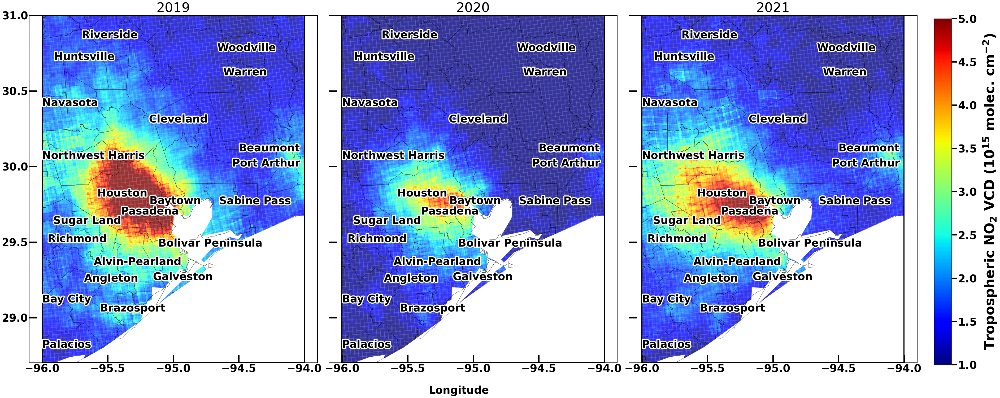

In [47]:
%%time

fig, axes = plt.subplots(1, 3, figsize=(60, 25))
plt.rcParams.update({'font.size': 40}) # legend ko title ko size

YEARS = ['2019', '2020', '2021']

image = 1

vmin = 1e+15
vmax = 5e+15


for index, year in tqdm(enumerate(YEARS)):
    print('year: ', year) 
    ax = plt.subplot(1, 3, image)
    
    ax1 = houston_area.geometry.boundary.plot(ax = ax, edgecolor = 'black', alpha = 0.5, linewidth = 1)
    # houston_area.apply(lambda x: ax1.annotate(text=x['NAME'], xy=x.geometry.centroid.coords[0],\
    #                             ha='center',fontsize = 35,color = 'black',fontweight='normal', alpha = 1), axis=1);
    houston_area.apply(lambda x: ax1.annotate(text=x['NAME'], xy=x.geometry.centroid.coords[0],\
                                    ha='center',fontsize = 40,color = 'black',fontweight='bold', alpha = 1, \
                                             path_effects=[pe.withStroke(linewidth=8, foreground="white")]), axis=1);
    
    ax.text(-94.5, 30.1, 'Beaumont', fontsize = 40, color = 'black', fontweight='bold', alpha = 1,  path_effects=[pe.withStroke(linewidth=8, foreground="white")])
    ax.text(-94.55, 30, 'Port Arthur', fontsize = 40, color = 'black', fontweight='bold', alpha = 1,  path_effects=[pe.withStroke(linewidth=8, foreground="white")])
    ax.text(-96, 30.4, 'Navasota', fontsize = 40, color = 'black', fontweight='bold', alpha = 1,  path_effects=[pe.withStroke(linewidth=8, foreground="white")])
    ax.text(-96, 30.05, 'Northwest Harris', fontsize = 40, color = 'black', fontweight='bold', alpha = 1,  path_effects=[pe.withStroke(linewidth=8, foreground="white")])
    ax.text(-96, 29.1, 'Bay City', fontsize = 40, color = 'black', fontweight='bold', alpha = 1,  path_effects=[pe.withStroke(linewidth=8, foreground="white")])
    ax.text(-96, 28.8, 'Palacios', fontsize = 40, color = 'black', fontweight='bold', alpha = 1,  path_effects=[pe.withStroke(linewidth=8, foreground="white")])
    ax.text(-94.65, 29.75, 'Sabine Pass', fontsize = 40, color = 'black', fontweight='bold', alpha = 1,  path_effects=[pe.withStroke(linewidth=8, foreground="white")])
          
    ax.xaxis.set_tick_params(labelsize=40)
    ax.yaxis.set_tick_params(labelsize=40)
    
    ax11 = houston.geometry.boundary.plot(ax = ax, edgecolor = 'black', alpha = 1, linewidth = 4)

    
    fishnet_x.plot(ax= ax, column = year, cmap = 'jet',linewidth = 0, gealpha = 0.8, edgecolor = 'black',legend = False, 
               missing_kwds = dict(color='grey', label='No Data'),
                markersize = 10, vmin =  vmin, vmax = vmax)


    ax.tick_params(labelsize=40)
    ax.set_ylim([28.7, 31])
    ax1.xaxis.set_major_locator(plt.MaxNLocator(5))
    # ax.set_xlim([28.7, 31.15])

    
    
    plt.text(0.5, 1.01, YEARS[index],fontweight='normal',
            horizontalalignment='center',
            fontsize=50,
            transform = ax.transAxes)
    
    # set various colors
    ax.spines['bottom'].set_color('black')
    ax.spines['top'].set_color('black') 
    ax.spines['right'].set_color('black')
    ax.spines['right'].set_linewidth(2)
    ax.spines['top'].set_linewidth(2)
    ax.spines['bottom'].set_linewidth(2)
    ax.spines['left'].set_color('black')
    ax.spines['left'].set_lw(2) 
    ax.tick_params(which='both', width=5)
    ax.tick_params(which='major', length=30)
    ax.tick_params(which='minor', length=10)
    ax.tick_params(which = 'both', direction = 'in')
    
        
    if image not in [1]:
        plt.setp(ax.get_yticklabels(), visible=False)
        
    image += 1

    
cax = fig.add_axes([0.915, 0.135, 0.015,0.725])
sm = plt.cm.ScalarMappable(cmap='jet', norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
cbar = fig.colorbar(sm, cax=cax,orientation='vertical')#, extend='both')
cbar.set_label('Tropospheric NO$_2$ VCD ($10^{15}$ molec. $\mathregular{cm^{-2}}$)', fontsize = 51, labelpad = 20, fontweight = 'bold')
cbar.ax.tick_params(length=20, width=5, which="major",  direction = 'out', labelright=True)
cbar.formatter.set_useMathText(True)
t = cbar.ax.yaxis.get_offset_text()
t.set_size(0)
fig.text(0.5, 0.08, 'Longitude', ha='center', va='center', fontsize = 40, fontweight = 'bold')
plt.subplots_adjust(wspace= 0.04)    

plt.savefig('continuous_legend.jpg',  bbox_inches='tight', dpi = 500)

# Experiment

In [47]:
from matplotlib.colors import Normalize
from matplotlib.colors import ListedColormap
import matplotlib.patheffects as pe

In [41]:
# colors = ['dark blu','light blue', 'blue','dark yellow', 'light yellow','yellow', 'dark red', 'light red', 'red']
# colors = ['#0049FF','#739BFF', '#CCDAFF','#FFFDC1', '#FFFB76','#FFF700', '#FFB0B0', '#FF7373', '#FF0000']
# colors = ['#0049FF','#739BFF', '#CCDAFF','#FFFDC1','#FFF700', '#FFB0B0', '#FF7373', '#FF0000']
# bins = [1e+15, 1.25e+15, 1.5e+15, 1.75e+15, 2.25e+15, 2.5e+15, 2.75e+15, 3e+15]

colors = ['blue', 'royalblue', 'cyan', 'yellow', 'orange', 'red']
bins = [1e+15, 1.4e+15, 1.8e+15, 2.2e+15, 2.6e+15, 3e+15]

0it [00:00, ?it/s]

year:  2019
year:  2020
year:  2021
CPU times: total: 26.2 s
Wall time: 26.3 s


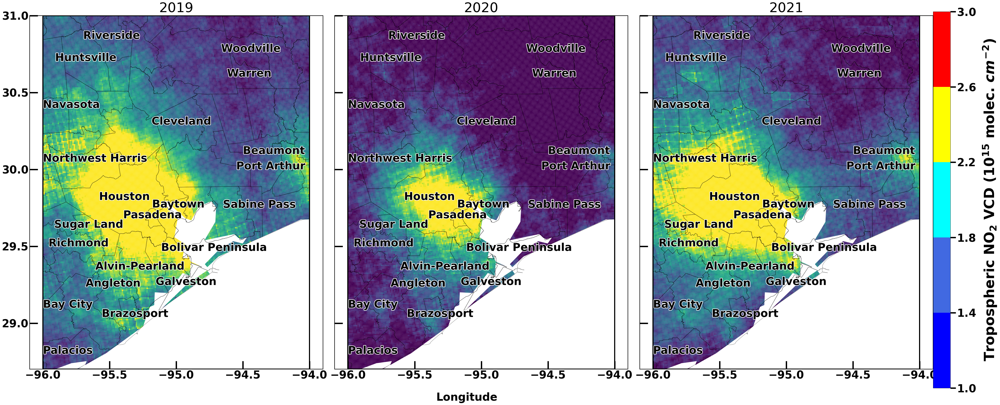

In [46]:
%%time

fig, axes = plt.subplots(1, 3, figsize=(60, 25))
plt.rcParams.update({'font.size': 40}) # legend ko title ko size

YEARS = ['2019', '2020', '2021']

image = 1

vmin = min(bins)
vmax = max(bins)

for index, year in tqdm(enumerate(YEARS)):
    print('year: ', year) 
    ax = plt.subplot(1, 3, image)
    
    ax1 = houston_area.geometry.boundary.plot(ax = ax, edgecolor = 'black', alpha = 0.5, linewidth = 1)
    # houston_area.apply(lambda x: ax1.annotate(text=x['NAME'], xy=x.geometry.centroid.coords[0],\
    #                             ha='center',fontsize = 35,color = 'black',fontweight='normal', alpha = 1), axis=1);
    houston_area.apply(lambda x: ax1.annotate(text=x['NAME'], xy=x.geometry.centroid.coords[0],\
                                    ha='center',fontsize = 40,color = 'black',fontweight='bold', alpha = 1, \
                                             path_effects=[pe.withStroke(linewidth=4, foreground="white")]), axis=1);
    
    ax.text(-94.5, 30.1, 'Beaumont', fontsize = 40, color = 'black', fontweight='bold', alpha = 1,  path_effects=[pe.withStroke(linewidth=4, foreground="white")])
    ax.text(-94.55, 30, 'Port Arthur', fontsize = 40, color = 'black', fontweight='bold', alpha = 1,  path_effects=[pe.withStroke(linewidth=4, foreground="white")])
    ax.text(-96, 30.4, 'Navasota', fontsize = 40, color = 'black', fontweight='bold', alpha = 1,  path_effects=[pe.withStroke(linewidth=4, foreground="white")])
    ax.text(-96, 30.05, 'Northwest Harris', fontsize = 40, color = 'black', fontweight='bold', alpha = 1,  path_effects=[pe.withStroke(linewidth=4, foreground="white")])
    ax.text(-96, 29.1, 'Bay City', fontsize = 40, color = 'black', fontweight='bold', alpha = 1,  path_effects=[pe.withStroke(linewidth=4, foreground="white")])
    ax.text(-96, 28.8, 'Palacios', fontsize = 40, color = 'black', fontweight='bold', alpha = 1,  path_effects=[pe.withStroke(linewidth=4, foreground="white")])
    ax.text(-94.65, 29.75, 'Sabine Pass', fontsize = 40, color = 'black', fontweight='bold', alpha = 1,  path_effects=[pe.withStroke(linewidth=4, foreground="white")])
    
    # 
    
    ax.xaxis.set_tick_params(labelsize=40)
    ax.yaxis.set_tick_params(labelsize=40)
    
    ax11 = houston.geometry.boundary.plot(ax = ax, edgecolor = 'black', alpha = 1, linewidth = 4)

    fishnet_x.plot(ax= ax, column = year,linewidth = 0,alpha = 1, edgecolor = 'black',\
                        legend = False,\
                        markersize = 5,
                   missing_kwds = dict(color='grey', label='No Data'),
                                             vmin =  vmin, vmax = vmax)


    ax.tick_params(labelsize=40)
    ax.set_ylim([28.7, 31])
    ax1.xaxis.set_major_locator(plt.MaxNLocator(5))
    # ax.set_xlim([28.7, 31.15])

    
    
    plt.text(0.5, 1.01, YEARS[index],fontweight='normal',
            horizontalalignment='center',
            fontsize=50,
            transform = ax.transAxes)
    
    # set various colors
    ax.spines['bottom'].set_color('black')
    ax.spines['top'].set_color('black') 
    ax.spines['right'].set_color('black')
    ax.spines['right'].set_linewidth(2)
    ax.spines['top'].set_linewidth(2)
    ax.spines['bottom'].set_linewidth(2)
    ax.spines['left'].set_color('black')
    ax.spines['left'].set_lw(2) 
    ax.tick_params(which='both', width=5)
    ax.tick_params(which='major', length=30)
    ax.tick_params(which='minor', length=10)
    ax.tick_params(which = 'both', direction = 'in')
    
        
    if image not in [1]:
        plt.setp(ax.get_yticklabels(), visible=False)
        
    image += 1

    
cax = fig.add_axes([0.9, 0.1, 0.015,0.775])
cmap = matplotlib.colors.ListedColormap(colors)
bounds = bins
norm = matplotlib.colors.BoundaryNorm(bounds, cmap.N)

cbar = fig.colorbar( matplotlib.cm.ScalarMappable(norm=norm, cmap=cmap), cax = cax, orientation = 'vertical')
cbar.set_label('Tropospheric NO$_2$ VCD ($10^{15}$ molec. $cm^{-2}$)', fontsize = 51, labelpad = 20, fontweight = 'bold')
cbar.ax.tick_params(length=20, width=5, which="major",  direction = 'out', labelright=True)
cbar.formatter.set_useMathText(True)
t = cbar.ax.yaxis.get_offset_text()
t.set_size(0)



fig.text(0.5, 0.08, 'Longitude', ha='center', va='center', fontsize = 40, fontweight = 'bold')
# fig.text(0.9, 0.5, 'Latitude', ha='center', va='center', fontsize = 40,rotation = 'vertical', fontweight = 'bold')
# fig.text(0.5, 1.015, 'Feb 24 to May 7', ha='center', va='center', fontsize = 70, fontweight = 'bold')
plt.subplots_adjust(wspace= 0.04)    

# plt.savefig('new_legend_custom_plot.jpg',  bbox_inches='tight', dpi = 500)
# plt.savefig('NewHouston_Feb24_May7_Averaged_3_years.jpg',  bbox_inches='tight', dpi = 300)

0it [00:00, ?it/s]

year:  2019
year:  2020
year:  2021
CPU times: total: 27.1 s
Wall time: 27.8 s


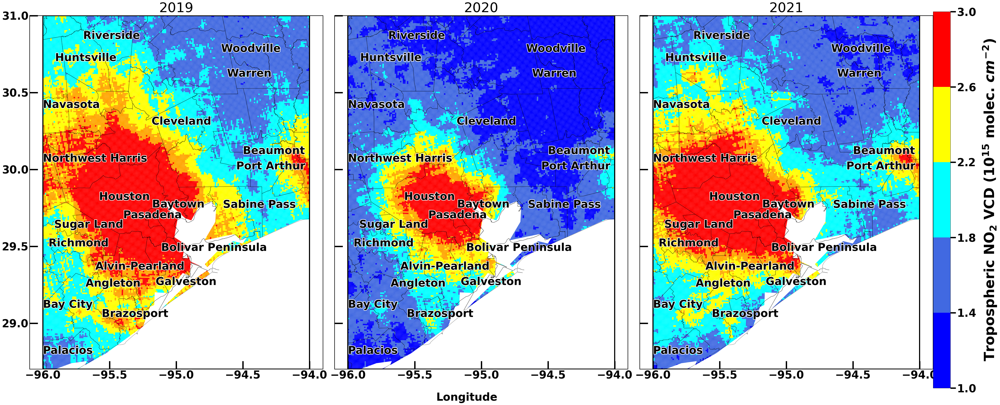

In [49]:
%%time

fig, axes = plt.subplots(1, 3, figsize=(60, 25))
plt.rcParams.update({'font.size': 40}) # legend ko title ko size

YEARS = ['2019', '2020', '2021']

image = 1

vmin = min(bins)
vmax = max(bins)

for index, year in tqdm(enumerate(YEARS)):
    print('year: ', year) 
    ax = plt.subplot(1, 3, image)
    
    ax1 = houston_area.geometry.boundary.plot(ax = ax, edgecolor = 'black', alpha = 0.5, linewidth = 1)
    # houston_area.apply(lambda x: ax1.annotate(text=x['NAME'], xy=x.geometry.centroid.coords[0],\
    #                             ha='center',fontsize = 35,color = 'black',fontweight='normal', alpha = 1), axis=1);
    houston_area.apply(lambda x: ax1.annotate(text=x['NAME'], xy=x.geometry.centroid.coords[0],\
                                    ha='center',fontsize = 40,color = 'black',fontweight='bold', alpha = 1, \
                                             path_effects=[pe.withStroke(linewidth=4, foreground="white")]), axis=1);
    
    ax.text(-94.5, 30.1, 'Beaumont', fontsize = 40, color = 'black', fontweight='bold', alpha = 1,  path_effects=[pe.withStroke(linewidth=4, foreground="white")])
    ax.text(-94.55, 30, 'Port Arthur', fontsize = 40, color = 'black', fontweight='bold', alpha = 1,  path_effects=[pe.withStroke(linewidth=4, foreground="white")])
    ax.text(-96, 30.4, 'Navasota', fontsize = 40, color = 'black', fontweight='bold', alpha = 1,  path_effects=[pe.withStroke(linewidth=4, foreground="white")])
    ax.text(-96, 30.05, 'Northwest Harris', fontsize = 40, color = 'black', fontweight='bold', alpha = 1,  path_effects=[pe.withStroke(linewidth=4, foreground="white")])
    ax.text(-96, 29.1, 'Bay City', fontsize = 40, color = 'black', fontweight='bold', alpha = 1,  path_effects=[pe.withStroke(linewidth=4, foreground="white")])
    ax.text(-96, 28.8, 'Palacios', fontsize = 40, color = 'black', fontweight='bold', alpha = 1,  path_effects=[pe.withStroke(linewidth=4, foreground="white")])
    ax.text(-94.65, 29.75, 'Sabine Pass', fontsize = 40, color = 'black', fontweight='bold', alpha = 1,  path_effects=[pe.withStroke(linewidth=4, foreground="white")])
    
    # 
    
    ax.xaxis.set_tick_params(labelsize=40)
    ax.yaxis.set_tick_params(labelsize=40)
    
    ax11 = houston.geometry.boundary.plot(ax = ax, edgecolor = 'black', alpha = 1, linewidth = 4)

    im = fishnet_x.plot(ax= ax, column = year,linewidth = 0,alpha = 1, edgecolor = 'black',\
                        legend = False,\
                        scheme="UserDefined", markersize = 5,
                   classification_kwds={'bins': bins}, 
                        cmap = ListedColormap(colors), norm=Normalize(0, len(bins)), missing_kwds = dict(color='grey', label='No Data'),
                                             vmin =  vmin, vmax = vmax)


    ax.tick_params(labelsize=40)
    ax.set_ylim([28.7, 31])
    ax1.xaxis.set_major_locator(plt.MaxNLocator(5))
    # ax.set_xlim([28.7, 31.15])

    
    
    plt.text(0.5, 1.01, YEARS[index],fontweight='normal',
            horizontalalignment='center',
            fontsize=50,
            transform = ax.transAxes)
    
    # set various colors
    ax.spines['bottom'].set_color('black')
    ax.spines['top'].set_color('black') 
    ax.spines['right'].set_color('black')
    ax.spines['right'].set_linewidth(2)
    ax.spines['top'].set_linewidth(2)
    ax.spines['bottom'].set_linewidth(2)
    ax.spines['left'].set_color('black')
    ax.spines['left'].set_lw(2) 
    ax.tick_params(which='both', width=5)
    ax.tick_params(which='major', length=30)
    ax.tick_params(which='minor', length=10)
    ax.tick_params(which = 'both', direction = 'in')
    
        
    if image not in [1]:
        plt.setp(ax.get_yticklabels(), visible=False)
        
    image += 1

    
cax = fig.add_axes([0.9, 0.1, 0.015,0.775])
cmap = matplotlib.colors.ListedColormap(colors)
bounds = bins
norm = matplotlib.colors.BoundaryNorm(bounds, cmap.N)

cbar = fig.colorbar( matplotlib.cm.ScalarMappable(norm=norm, cmap=cmap), cax = cax, orientation = 'vertical')
cbar.set_label('Tropospheric NO$_2$ VCD ($10^{15}$ molec. $cm^{-2}$)', fontsize = 51, labelpad = 20, fontweight = 'bold')
cbar.ax.tick_params(length=20, width=5, which="major",  direction = 'out', labelright=True)
cbar.formatter.set_useMathText(True)
t = cbar.ax.yaxis.get_offset_text()
t.set_size(0)



fig.text(0.5, 0.08, 'Longitude', ha='center', va='center', fontsize = 40, fontweight = 'bold')
# fig.text(0.9, 0.5, 'Latitude', ha='center', va='center', fontsize = 40,rotation = 'vertical', fontweight = 'bold')
# fig.text(0.5, 1.015, 'Feb 24 to May 7', ha='center', va='center', fontsize = 70, fontweight = 'bold')
plt.subplots_adjust(wspace= 0.04)    

# plt.savefig('new_legend_custom_plot.jpg',  bbox_inches='tight', dpi = 500)
# plt.savefig('NewHouston_Feb24_May7_Averaged_3_years.jpg',  bbox_inches='tight', dpi = 300)

# New custom legend with more intervals

In [45]:
colors = {'Dark blue': '#0023FF', 'lighter dark blue': '#435DFF', 'Ligher cyan': '#4AD0FF', 'Cyan': '#00F3FF',\
         '5th':'#71EFC4', '6th': '#D5FF3A', 'Yellow': '#FFFF4D',\
         'Last third': '#FFA900','Last second': '#FF7200','Last':'#FF0000'}

colors = list(colors.values())

In [47]:
len(colors)

10

In [59]:
bins = np.linspace(1e+15, 6.5e+15, 10)

In [60]:
bins

array([1.00000000e+15, 1.61111111e+15, 2.22222222e+15, 2.83333333e+15,
       3.44444444e+15, 4.05555556e+15, 4.66666667e+15, 5.27777778e+15,
       5.88888889e+15, 6.50000000e+15])

0it [00:00, ?it/s]

year:  2019
year:  2020
year:  2021
CPU times: total: 26.4 s
Wall time: 26.8 s


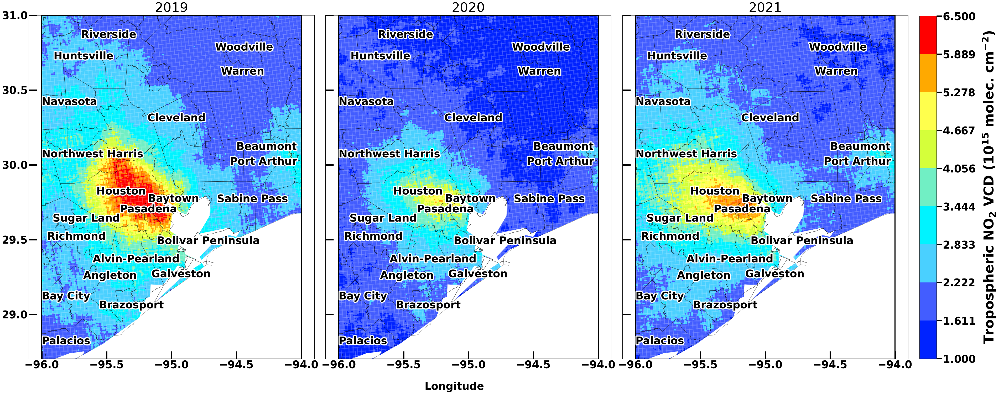

In [61]:
%%time

fig, axes = plt.subplots(1, 3, figsize=(60, 25))
plt.rcParams.update({'font.size': 40}) # legend ko title ko size

YEARS = ['2019', '2020', '2021']

image = 1

vmin = min(bins)
vmax = max(bins)

for index, year in tqdm(enumerate(YEARS)):
    print('year: ', year) 
    ax = plt.subplot(1, 3, image)
    
    ax1 = houston_area.geometry.boundary.plot(ax = ax, edgecolor = 'black', alpha = 0.5, linewidth = 1)
    # houston_area.apply(lambda x: ax1.annotate(text=x['NAME'], xy=x.geometry.centroid.coords[0],\
    #                             ha='center',fontsize = 35,color = 'black',fontweight='normal', alpha = 1), axis=1);
    houston_area.apply(lambda x: ax1.annotate(text=x['NAME'], xy=x.geometry.centroid.coords[0],\
                                    ha='center',fontsize = 40,color = 'black',fontweight='bold', alpha = 1, \
                                             path_effects=[pe.withStroke(linewidth=8, foreground="white")]), axis=1);
    
    ax.text(-94.5, 30.1, 'Beaumont', fontsize = 40, color = 'black', fontweight='bold', alpha = 1,  path_effects=[pe.withStroke(linewidth=8, foreground="white")])
    ax.text(-94.55, 30, 'Port Arthur', fontsize = 40, color = 'black', fontweight='bold', alpha = 1,  path_effects=[pe.withStroke(linewidth=8, foreground="white")])
    ax.text(-96, 30.4, 'Navasota', fontsize = 40, color = 'black', fontweight='bold', alpha = 1,  path_effects=[pe.withStroke(linewidth=8, foreground="white")])
    ax.text(-96, 30.05, 'Northwest Harris', fontsize = 40, color = 'black', fontweight='bold', alpha = 1,  path_effects=[pe.withStroke(linewidth=8, foreground="white")])
    ax.text(-96, 29.1, 'Bay City', fontsize = 40, color = 'black', fontweight='bold', alpha = 1,  path_effects=[pe.withStroke(linewidth=8, foreground="white")])
    ax.text(-96, 28.8, 'Palacios', fontsize = 40, color = 'black', fontweight='bold', alpha = 1,  path_effects=[pe.withStroke(linewidth=8, foreground="white")])
    ax.text(-94.65, 29.75, 'Sabine Pass', fontsize = 40, color = 'black', fontweight='bold', alpha = 1,  path_effects=[pe.withStroke(linewidth=8, foreground="white")])
          
    ax.xaxis.set_tick_params(labelsize=40)
    ax.yaxis.set_tick_params(labelsize=40)
    
    ax11 = houston.geometry.boundary.plot(ax = ax, edgecolor = 'black', alpha = 1, linewidth = 4)

    im = fishnet_x.plot(ax= ax, column = year,linewidth = 0,alpha = 1, edgecolor = 'black',\
                        legend = False,\
                        scheme="UserDefined", markersize = 5,
                   classification_kwds={'bins': bins}, 
                        cmap = ListedColormap(colors), norm=Normalize(0, len(bins)), missing_kwds = dict(color='grey', label='No Data'),
                                             vmin =  vmin, vmax = vmax)


    ax.tick_params(labelsize=40)
    ax.set_ylim([28.7, 31])
    ax1.xaxis.set_major_locator(plt.MaxNLocator(5))
    # ax.set_xlim([28.7, 31.15])

    
    
    plt.text(0.5, 1.01, YEARS[index],fontweight='normal',
            horizontalalignment='center',
            fontsize=50,
            transform = ax.transAxes)
    
    # set various colors
    ax.spines['bottom'].set_color('black')
    ax.spines['top'].set_color('black') 
    ax.spines['right'].set_color('black')
    ax.spines['right'].set_linewidth(2)
    ax.spines['top'].set_linewidth(2)
    ax.spines['bottom'].set_linewidth(2)
    ax.spines['left'].set_color('black')
    ax.spines['left'].set_lw(2) 
    ax.tick_params(which='both', width=5)
    ax.tick_params(which='major', length=30)
    ax.tick_params(which='minor', length=10)
    ax.tick_params(which = 'both', direction = 'in')
    
        
    if image not in [1]:
        plt.setp(ax.get_yticklabels(), visible=False)
        
    image += 1

    
cax = fig.add_axes([0.91, 0.14, 0.015,0.725])
cmap = matplotlib.colors.ListedColormap(colors)
bounds = bins
norm = matplotlib.colors.BoundaryNorm(bounds, cmap.N)

cbar = fig.colorbar( matplotlib.cm.ScalarMappable(norm=norm, cmap=cmap), cax = cax, orientation = 'vertical')
cbar.set_label('Tropospheric NO$_2$ VCD ($10^{15}$ molec. $\mathregular{cm^{-2}}$)', fontsize = 51, labelpad = 20, fontweight = 'bold')
cbar.ax.tick_params(length=20, width=5, which="major",  direction = 'out', labelright=True)
cbar.formatter.set_useMathText(True)
t = cbar.ax.yaxis.get_offset_text()
t.set_size(0)



fig.text(0.5, 0.08, 'Longitude', ha='center', va='center', fontsize = 40, fontweight = 'bold')
# fig.text(0.9, 0.5, 'Latitude', ha='center', va='center', fontsize = 40,rotation = 'vertical', fontweight = 'bold')
# fig.text(0.5, 1.015, 'Feb 24 to May 7', ha='center', va='center', fontsize = 70, fontweight = 'bold')
plt.subplots_adjust(wspace= 0.04)    

# plt.savefig('new_legend_custom_plot.jpg',  bbox_inches='tight', dpi = 500)
# plt.savefig('NewHouston_Feb24_May7_Averaged_3_years.jpg',  bbox_inches='tight', dpi = 300)

# Combined with Yearly boxplot

In [67]:
df = pd.read_csv(r"C:\Users\Lenovo\Desktop\Texas TROPOMI\Individual Cities\Houston\Houston_Tropomi_csv.csv")
df = df[(df.QA_Value > 75) & (df.ColumnAmountNO2Trop > -0.5e15)].reset_index(drop = True)
df = df[['ColumnAmountNO2Trop', 'Date']]
df['Year'] = pd.to_datetime(df['Date']).dt.year
df['Month'] = pd.to_datetime(df['Date']).dt.month
df['Day'] = pd.to_datetime(df['Date']).dt.day
df = df[df.Year != 2018].reset_index(drop = True)

In [197]:
mean_df.groupby('Year')['Month'].unique()

Year
2019    [3, 4]
2020    [3, 4]
2021    [3, 4]
Name: Month, dtype: object

In [198]:
mean_df = mean_df[mean_df.Month.isin([3,4])]

In [199]:
means = mean_df.groupby('Year')['ColumnAmountNO2Trop'].mean().values

In [200]:
means

array([2.17528222e+15, 1.30312111e+15, 1.84620827e+15])

In [201]:
initial = means[0]
final = means[1]
(final - initial) / initial

-0.4009415859409896

In [202]:
initial = means[0]
final = means[2]
(final - initial) / initial

-0.15127873892044202

CPU times: total: 93.8 ms
Wall time: 83 ms


Text(0.85, 0.92, '-15 %')

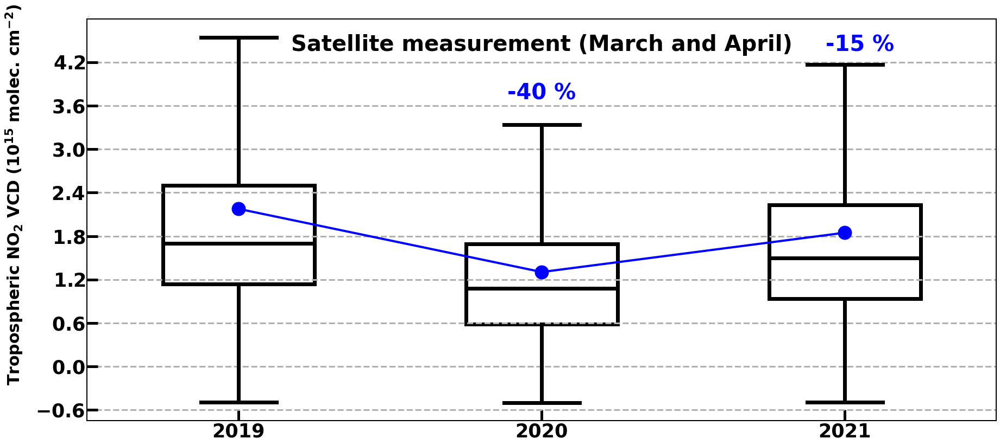

In [208]:
%%time

fig, axes = plt.subplots(1, 1, figsize=(30, 30))
ax1 = plt.subplot(1, 1, 1) 

ax1 = plt.subplot(2, 1, 1) 
sns.boxplot(x = 'Year', y = 'ColumnAmountNO2Trop', width=.5,linewidth = 7.,\
                    data = mean_df, showmeans=True, saturation = 1, palette=['black'],showfliers = False, fliersize=0,\
                 meanprops={"marker":"o","markerfacecolor":"blue", "markeredgecolor":"blue", 'markersize':25}, ax = ax1)

sns.pointplot(data=mean_df, x='Year', y= 'ColumnAmountNO2Trop', ci=None,
  dodge=.8 - .8 / 3, scale=1.5, color='blue', marker='o')

ax1.set_xlabel('')
ax1.set_ylabel('')

box_patches = [patch for patch in ax1.patches if type(patch) == matplotlib.patches.PathPatch]
if len(box_patches) == 0:  # in matplotlib older than 3.5, the boxes are stored in ax2.artists
    box_patches = ax1.artists
num_patches = len(box_patches)
lines_per_boxplot = len(ax1.lines) // num_patches
for i, patch in enumerate(box_patches):
    # Set the linecolor on the patch to the facecolor, and set the facecolor to None
    col = patch.get_facecolor()
    patch.set_edgecolor(col)
    patch.set_facecolor('None')


ax1.tick_params(axis ='y', labelcolor = 'black', labelsize = 35) 
ax1.tick_params(axis ='x', labelbottom=True, labelsize = 35) 
ax1.yaxis.set_major_locator(plt.MaxNLocator(10))


ax1.spines['bottom'].set_color('black')
ax1.spines['top'].set_color('black') 
ax1.spines['right'].set_color('black')
ax1.spines['right'].set_linewidth(2)
ax1.spines['top'].set_linewidth(2)
ax1.spines['bottom'].set_linewidth(2)
ax1.spines['left'].set_color('black')
ax1.spines['left'].set_lw(2)

# for ax1 
ax1.tick_params(which='both', width=5)
ax1.tick_params(which='major', length=20)
ax1.tick_params(which='minor', length=15)
ax1.tick_params(which = 'both', direction = 'in')
ax1.grid(True, axis = 'y', which = 'major', alpha = 1, linestyle='--', linewidth = 3)

from matplotlib import ticker
formatter = ticker.ScalarFormatter(useMathText=True)
formatter.set_scientific(True) 
formatter.set_powerlimits((-1,0)) 
ax1.yaxis.set_major_formatter(formatter)
ax1.ticklabel_format(style='scientific', axis = 'y') 
t = ax1.yaxis.get_offset_text()
t.set_size(0)

ax1.text(0.5, 0.92, 'Satellite measurement (March and April)', horizontalalignment='center',transform=ax1.transAxes, fontsize = 40, fontweight="bold", rotation = 'horizontal')

# ax1.text(0.5, 0., 'Date', ha='center', va='center', fontsize = 30) 'meters $\mathregular{10^{-1}}$'
ax1.text(-0.08, 0.1, 'Tropospheric NO$_2$ VCD ($10^{15}$ molec. $\mathregular{cm^{-2}}$)', \
          horizontalalignment='center',transform=ax1.transAxes, fontsize = 30, fontweight="bold", rotation = 'vertical')


ax1.text(0.5, 0.8, '-40 %', horizontalalignment='center',transform=ax1.transAxes, fontsize = 40, fontweight="bold", rotation = 'horizontal', color = 'blue')
ax1.text(0.85, 0.92, '-15 %', horizontalalignment='center',transform=ax1.transAxes, fontsize = 40, fontweight="bold", rotation = 'horizontal', color = 'blue')

# fig.savefig("yearly_boxplot_houston(MarchApril).jpg", dpi = 500, bbox_inches='tight')

CPU times: total: 9.3 s
Wall time: 9.38 s


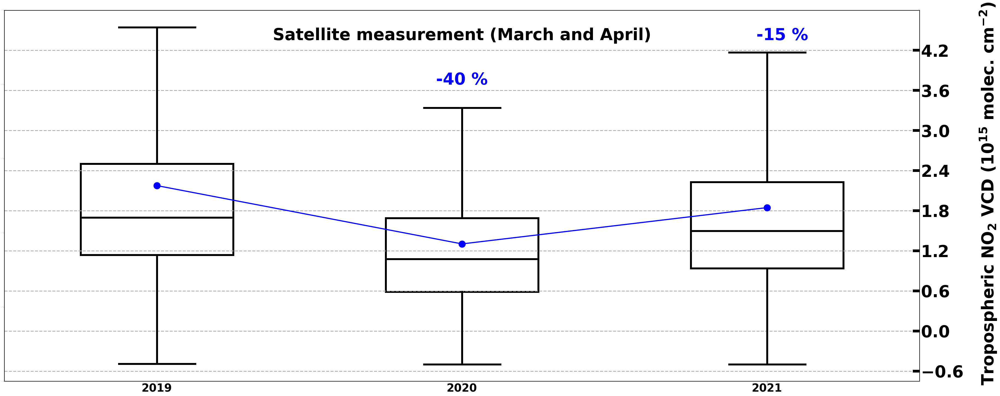

In [233]:
%%time

fig, axes = plt.subplots(1, 1, figsize=(60, 25))
ax0 = plt.subplot(1, 1, 1) 
ax0.tick_params(axis ='y', labelsize = 0) 


ax1 = ax0.twinx()    
sns.boxplot(x = 'Year', y = 'ColumnAmountNO2Trop', width=.5,linewidth = 7.,\
                    data = mean_df, showmeans=True, saturation = 1, palette=['black'],showfliers = False, fliersize=0,\
                 meanprops={"marker":"o","markerfacecolor":"blue", "markeredgecolor":"blue", 'markersize':25}, ax = ax1)

sns.pointplot(data=mean_df, x='Year', y= 'ColumnAmountNO2Trop', ci=None,
  dodge=.8 - .8 / 3, scale=1.5, color='blue', marker='o')

ax1.set_xlabel('')
ax1.set_ylabel('')

box_patches = [patch for patch in ax1.patches if type(patch) == matplotlib.patches.PathPatch]
if len(box_patches) == 0:  # in matplotlib older than 3.5, the boxes are stored in ax2.artists
    box_patches = ax1.artists
num_patches = len(box_patches)
lines_per_boxplot = len(ax1.lines) // num_patches
for i, patch in enumerate(box_patches):
    # Set the linecolor on the patch to the facecolor, and set the facecolor to None
    col = patch.get_facecolor()
    patch.set_edgecolor(col)
    patch.set_facecolor('None')


ax1.tick_params(axis ='y', labelcolor = 'black', labelsize = 60) 
ax1.tick_params(axis ='x', labelbottom=True, labelsize = 60) 
ax1.yaxis.set_major_locator(plt.MaxNLocator(10))


ax1.spines['bottom'].set_color('black')
ax1.spines['top'].set_color('black') 
ax1.spines['right'].set_color('black')
ax1.spines['right'].set_linewidth(2)
ax1.spines['top'].set_linewidth(2)
ax1.spines['bottom'].set_linewidth(2)
ax1.spines['left'].set_color('black')
ax1.spines['left'].set_lw(2)

# for ax1 
ax1.tick_params(which='both', width=10)
ax1.tick_params(which='major', length=25)
ax1.tick_params(which='minor', length=25)
ax1.tick_params(which = 'both', direction = 'in')
ax1.grid(True, axis = 'y', which = 'major', alpha = 1, linestyle='--', linewidth = 3)

from matplotlib import ticker
formatter = ticker.ScalarFormatter(useMathText=True)
formatter.set_scientific(True) 
formatter.set_powerlimits((-1,0)) 
ax1.yaxis.set_major_formatter(formatter)
ax1.ticklabel_format(style='scientific', axis = 'y') 
t = ax1.yaxis.get_offset_text()
t.set_size(0)

ax1.text(0.5, 0.92, 'Satellite measurement (March and April)', horizontalalignment='center',transform=ax1.transAxes, fontsize = 60, fontweight="bold", rotation = 'horizontal')

# ax1.text(0.5, 0., 'Date', ha='center', va='center', fontsize = 30) 'meters $\mathregular{10^{-1}}$'
ax1.text(1.075, 0.0, 'Tropospheric NO$_2$ VCD ($10^{15}$ molec. $\mathregular{cm^{-2}}$)', \
          horizontalalignment='center',transform=ax1.transAxes, fontsize = 60, fontweight="bold", rotation = 'vertical')


ax1.text(0.5, 0.8, '-40 %', horizontalalignment='center',transform=ax1.transAxes, fontsize = 60, fontweight="bold", rotation = 'horizontal', color = 'blue')
ax1.text(0.85, 0.92, '-15 %', horizontalalignment='center',transform=ax1.transAxes, fontsize = 60, fontweight="bold", rotation = 'horizontal', color = 'blue')

fig.savefig("yearly_boxplot_houston(MarchApril).jpg", dpi = 500, bbox_inches='tight')